In [ ]:
!nvidia-smi

/bin/bash: nvidia-smi: command not found


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# SuperGradients How To Use a model to Predict

In this tutorial we will use SG pretrained models to predict on an image.

The notebook is divided into 3 tasks:
1. Semantic segmentation
2. Object detection
3. Classification

Each task is divided into 3 sections:
1. Load an image
2. Load a pretrained model
3. Inferenece


#Install SG and deci's dependecies


In [ ]:
! pip install super-gradients==3.1.1 gwpy &> /dev/null

In [ ]:
! pip install matplotlib==3.1.3 &> /dev/null


# 1. Object detection

For the sake of this presentation, We'll use COCO dataset that can be found [here](https://cocodataset.org/#home).

We will use YoloX-S model for inference.



### A. Load an image

In [ ]:
import requests
# !pip install -U Pillow
# !pip install Pillow
from PIL import Image
from io import BytesIO


# Image can be both uploaded to colab server or by a direct URL
# image_path = "/content/drive/MyDrive/data_noise/test/images/0q2.jpg"

# Load image from url
# response = requests.get(image_path)

# Get PIL image
image = Image.open('/content/drive/MyDrive/cartest_final.jpg')

<class 'PIL.JpegImagePlugin.JpegImageFile'> (1280, 960)


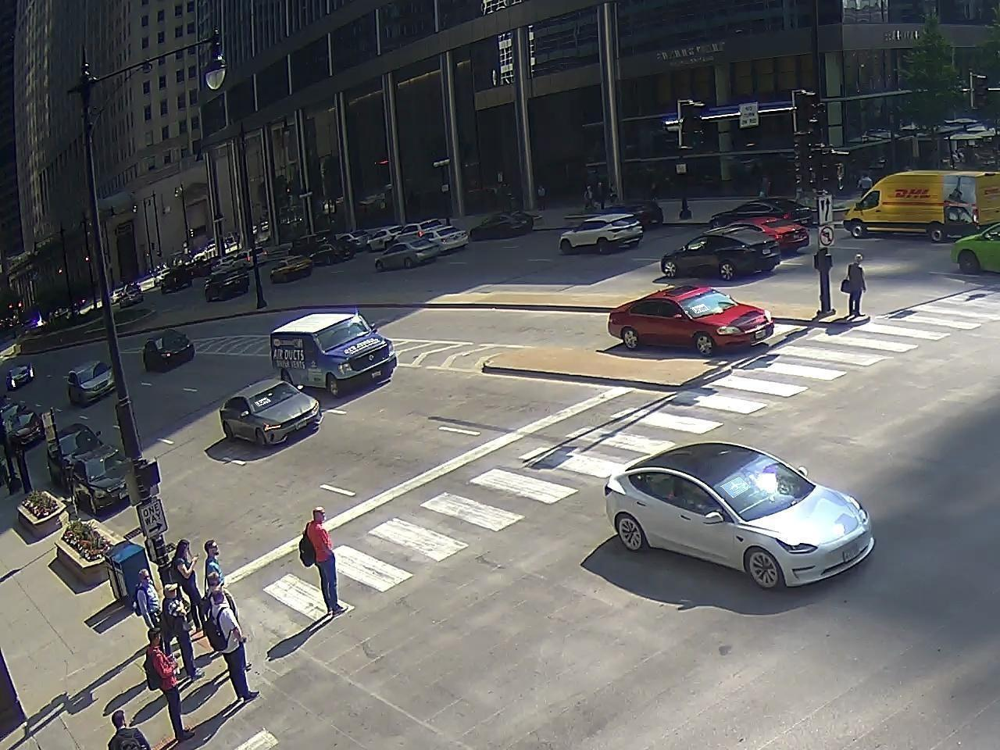

In [ ]:
# Visualize
print(type(image), image.size)
image

### Preprocess

### B. Load a pretrained model

In [ ]:
from super_gradients.training import models
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

# Get pretrained model from super-gradients repository.
# model = models.get("yolo_nas_l", pretrained_weights="coco", num_classes=80)


model = models.get(
    'yolo_nas_l',
    num_classes=1,
    checkpoint_path='/content/drive/MyDrive/checkpoints-yolonasl-noise/rideshare/average_model.pth'
).to(DEVICE)




[2023-07-09 05:10:44] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


/usr/local/lib/python3.10/dist-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
[2023-07-09 05:10:53] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-07-09 05:10:53] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-07-09 05:10:53] WARNING - export.py - Failed to import pytorch_quantization
[2023-07-09 05:10:53] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-07-09 05:10:53] WARNING - env_sanity_check.py - Failed to verify installed packages: matplotlib==3.1.3 does not satisfy requirement matplotlib>=3.3.4
[2023-07-09 05:11:21] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/drive/MyDrive/checkpoints-yolonasl-noise/rideshare/average_model.pth EMA checkpoint.


### C. Inference

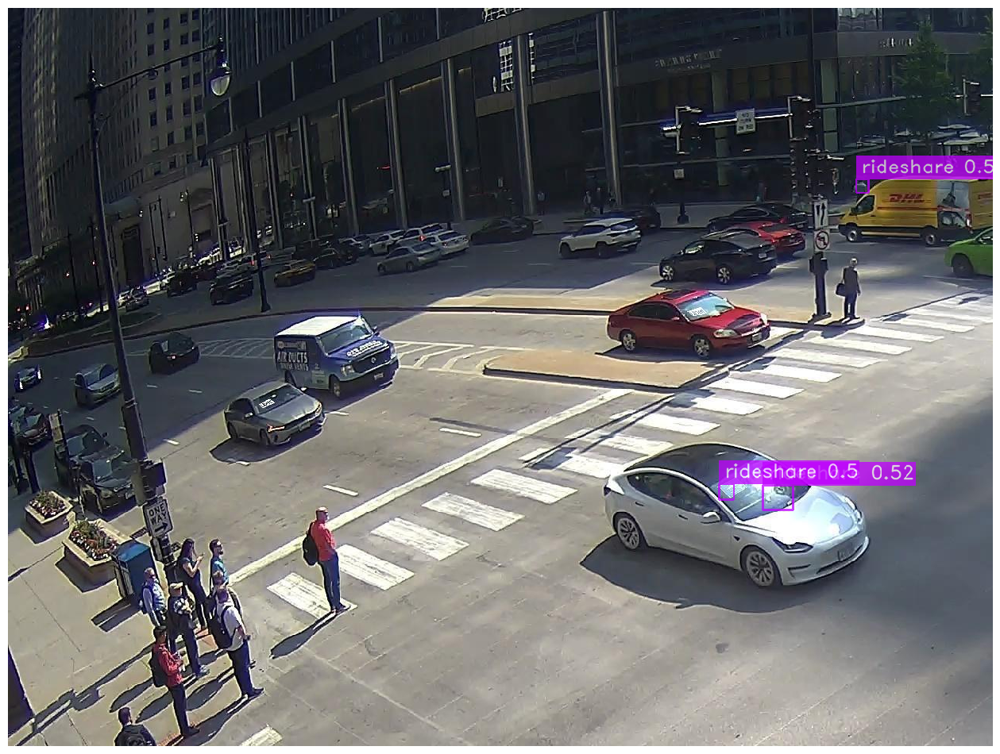

In [ ]:
# model.predict(transformed_image,  conf=0.4 ).show()
model.predict(image, conf = 0.4).show()

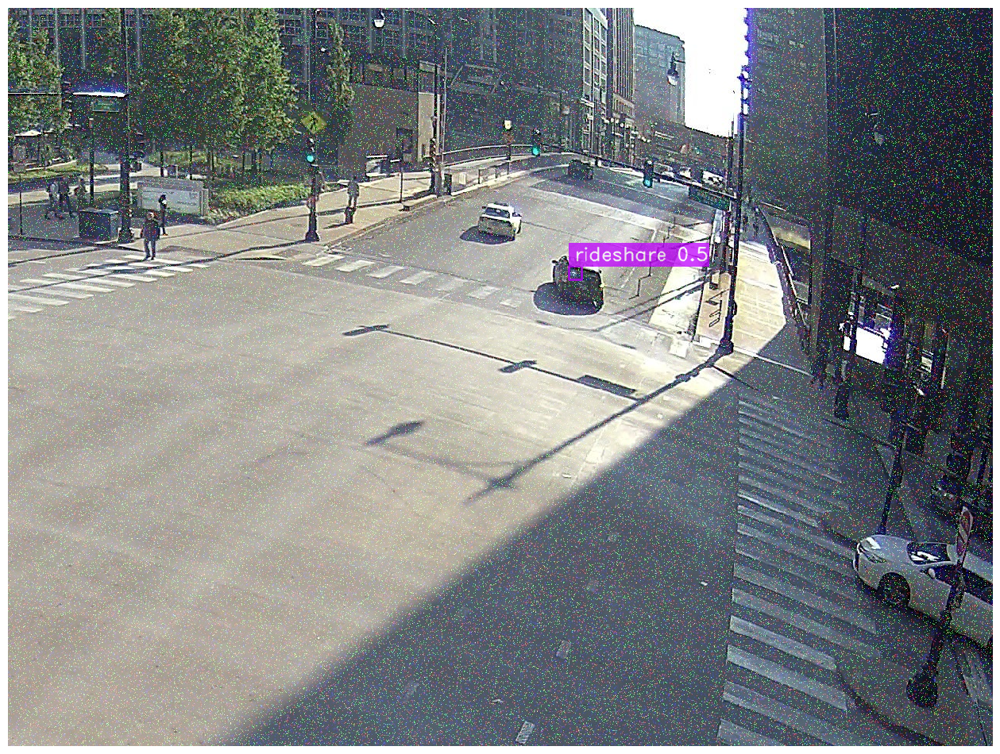

In [ ]:
im = "/content/drive/MyDrive/data_noise/test/images/235q2.jpg"
model.predict(im,  conf=0.4 ).show()

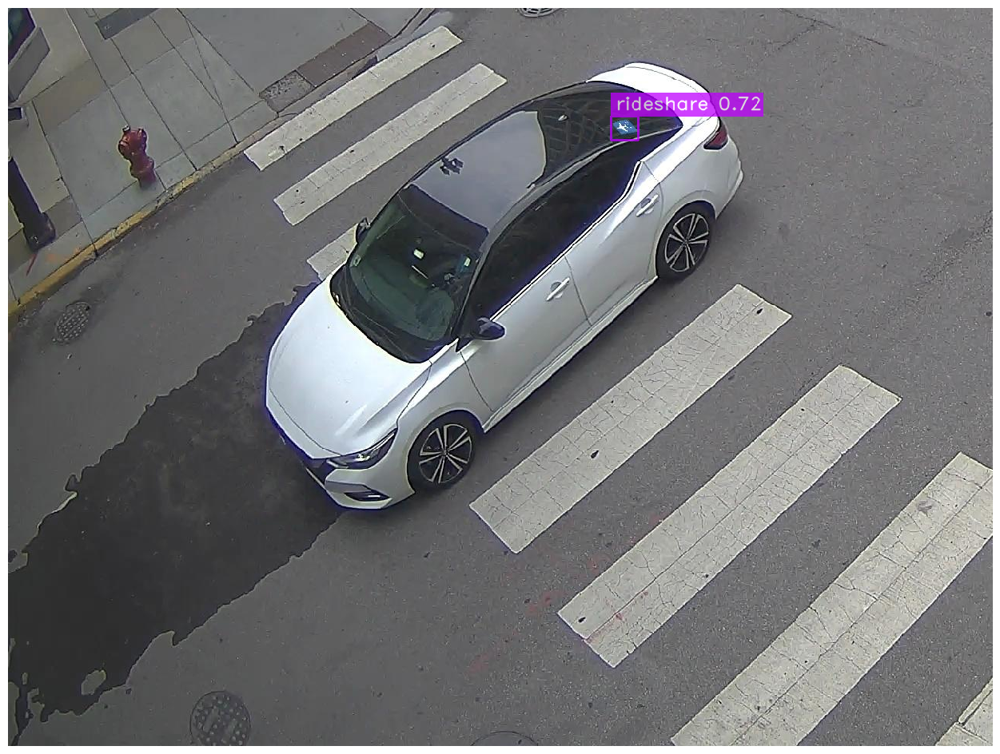

In [ ]:
im = "/content/drive/MyDrive/data/test/images/120q3_W02C.jpg"
model.predict(im, conf= 0.4).show()

In [ ]:
ROOT_DIR = '/content/drive/MyDrive/data_noise'
train_imgs_dir = '/content/drive/MyDrive/data_noise/train/images'
train_labels_dir = '/content/drive/MyDrive/data_noise/train/labels'
val_imgs_dir = '/content/drive/MyDrive/data_noise/val/images'
val_labels_dir = '/content/drive/MyDrive/data_noise/val/labels'
test_imgs_dir = '/content/drive/MyDrive/data_noise/test/images'
test_labels_dir = '/content/drive/MyDrive/data_noise/test/labels'
classes = ['rideshare']

dataset_params = {
    'data_dir':ROOT_DIR,
    'train_images_dir':train_imgs_dir,
    'train_labels_dir':train_labels_dir,
    'val_images_dir':val_imgs_dir,
    'val_labels_dir':val_labels_dir,
    'test_images_dir':test_imgs_dir,
    'test_labels_dir':test_labels_dir,
    'classes':classes
}

import collections
collections.Iterable = collections.abc.Iterable


In [ ]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': 16,
        'num_workers': 2
    }
)

Caching annotations:  98%|█████████▊| 119/121 [00:14<00:00, 13.02it/s]

In [ ]:
!pip install -q supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.6/55.6 kB 2.4 MB/s eta 0:00:00


In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path='/content/drive/MyDrive/data_noise/test/images',
    annotations_directory_path='/content/drive/MyDrive/data_noise/test/labels',
    data_yaml_path='/content/drive/MyDrive/data_noise/data.yaml',
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections

### Postprocess - for NOISE images

In [ ]:
from super_gradients.training.models.detection_models.yolo_base import YoloPostPredictionCallback
# Callback uses NMS, confidence threshold
# predictions = YoloPostPredictionCallback(conf=0.1, iou=0.4)(raw_predictions)[0].numpy()
predictions = model.get_post_prediction_callback(0.1, 0.4)

In [ ]:
import random
random.seed(10)

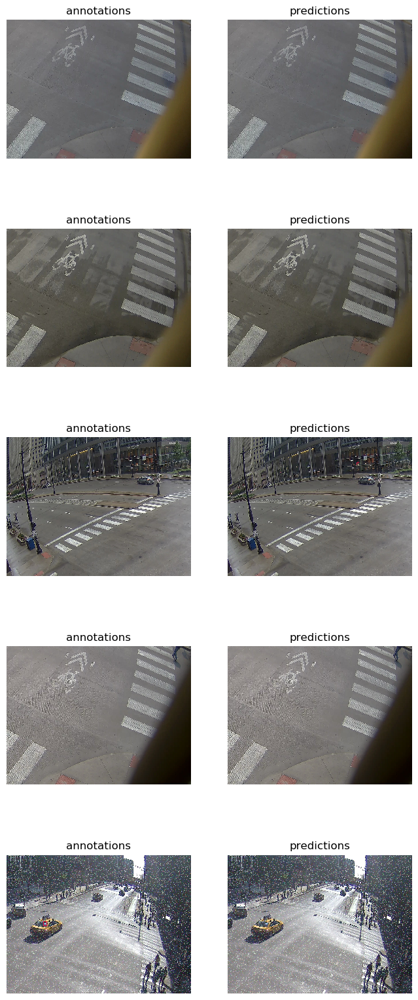

In [ ]:
import supervision as sv
import random

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(5, 2), size=(2 * 4, n * 4))

In [ ]:
!pip install onemetric

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 4.8 MB/s eta 0:00:00


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

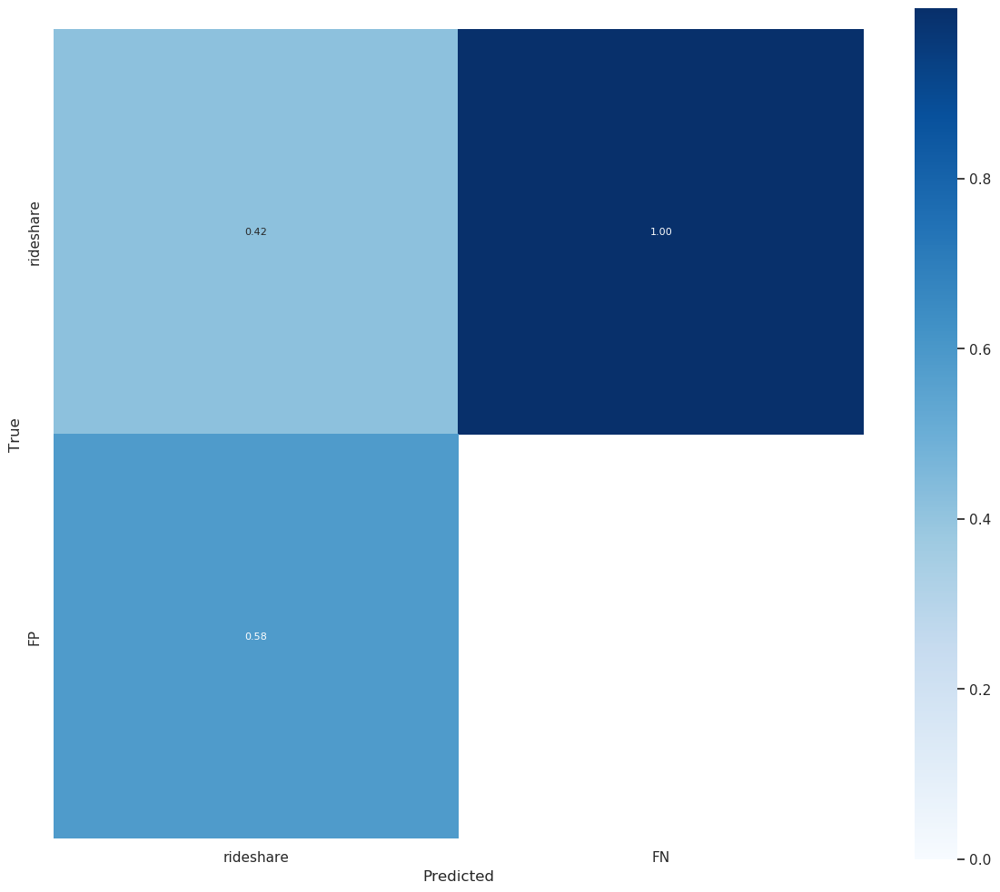

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

In [ ]:
import supervision as sv


In [ ]:

ds = sv.DetectionDataset.from_yolo(
    images_directory_path='/content/drive/MyDrive/data/test/images',
    annotations_directory_path='/content/drive/MyDrive/data/test/labels',
    data_yaml_path='/content/drive/MyDrive/data/data.yaml',
    force_masks=False
)

In [ ]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = list(model.predict(image, conf=CONFIDENCE_TRESHOLD))[0]
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections



### Postprocess - for CLEAR images

In [ ]:
# from super_gradients.training.models.detection_models.yolo_base import YoloPostPredictionCallback
# Callback uses NMS, confidence threshold
from super_gradients.training.models.detection_models.yolo_base import YoloPostPredictionCallback
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

# predictions = YoloPostPredictionCallback(conf=0.1, iou=0.4)(predictions).numpy()
# predictions = model.get_post_prediction_callback(0.1, 0.4)
# predictions = YoloPostPredictionCallback(conf=0.001, iou=0.6)
# predictions = PPYoloEPostPredictionCallback(score_threshold=0.001, nms_threshold=0.7, nms_top_k=1000, max_predictions=300)
post_prediction_callback = PPYoloEPostPredictionCallback(score_threshold=0.01, nms_threshold=0.7, nms_top_k=1000, max_predictions=300)

In [ ]:
import torch
import numpy as np
from tqdm import tqdm

from super_gradients.training import models
from super_gradients.training.metrics import IoU, DetectionMetrics_050, DetectionMetrics_075, DetectionMetrics_050_095
from super_gradients.training.transforms.transforms import *
from super_gradients.training.datasets.data_formats.default_formats import XYXY_LABEL, LABEL_CXCYWH


met = DetectionMetrics_050(score_thres=0.01, top_k_predictions=300, num_cls=80, normalize_targets=True, post_prediction_callback=post_prediction_callback)


data_loader_itr = iter(test_data)

model.eval()
with torch.no_grad():
        for batch_idx, batch_items in enumerate(tqdm(data_loader_itr)):
                # print(f'{batch_idx}, {len(batch_items)}')

                imgs, targets = batch_items[0].to(DEVICE), batch_items[1].to(DEVICE)

                raw_output = model(imgs)
                met.update(preds=raw_output, target=targets, device=DEVICE, inputs=imgs)
                map_result = met.compute()
                # print(f"{batch_idx} map_result: {map_result}")

map_result = met.compute()
print(f"map_result: {map_result}")


100%|██████████| 4/4 [07:19<00:00, 93.80s/it] 

In [ ]:
import random
random.seed(10)

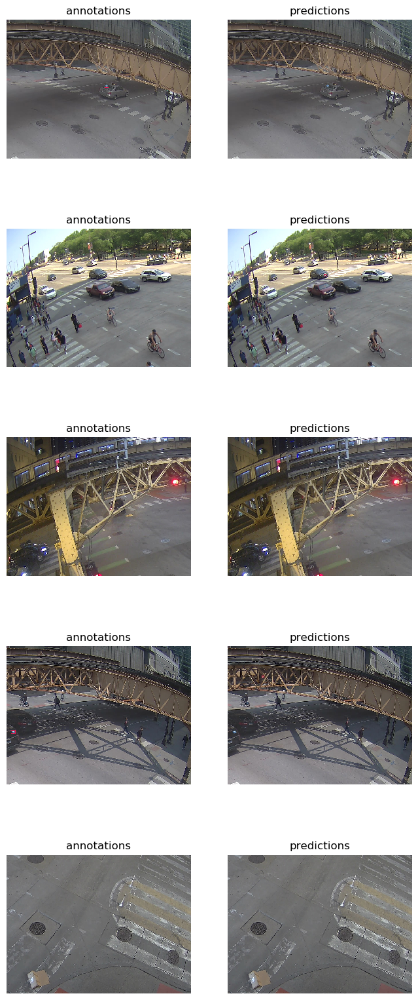

In [ ]:
import supervision as sv
import random

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(5, 2), size=(2 * 4, n * 4))

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

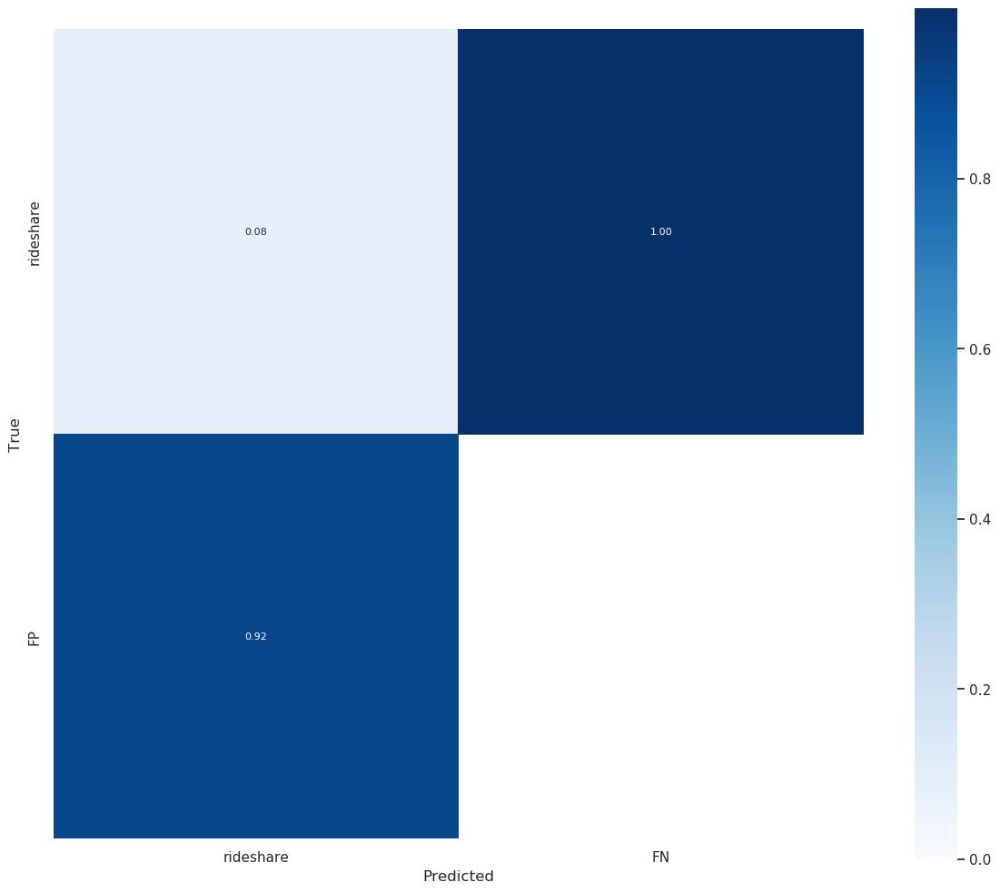

In [ ]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

### A. Load an image

In [ ]:
import requests
from PIL import Image
from io import BytesIO

# Image can be both uploaded to colab server or by a direct URL
# url =  "https://s.hs-data.com/bilder/spieler/gross/128069.jpg"

# # Load image from url
# response = requests.get(url)

# # Get PIL image
# image = Image.open(BytesIO(response.content))

(1280, 960)


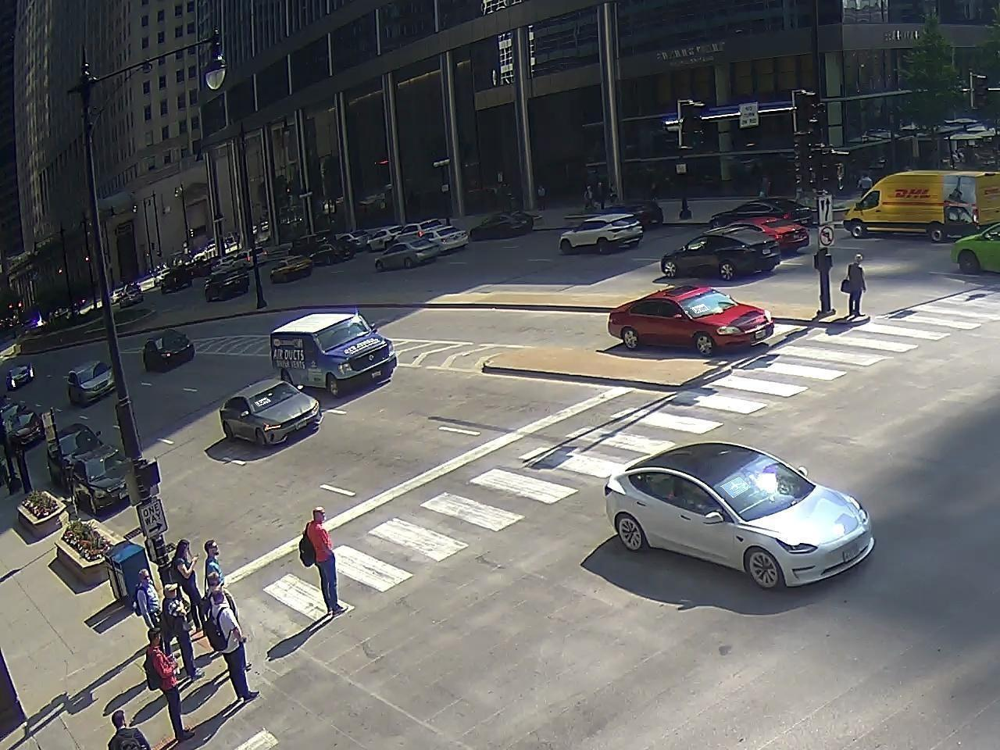

In [ ]:
# Visualize
print(image.size)
image

### Preprocess

In [ ]:
import torchvision.transforms as transforms
import torch

# Prepare preprcoess transformations
pre_proccess = transforms.Compose([
    transforms.Resize([640, 640]),
    transforms.ToTensor(),
    transforms.Normalize([.485, .456, .406], [.229, .224, .225])
])

# Run preprocess on image. unsqueeze for [Batch x Channels x Width x Height] format
transformed_image = pre_proccess(image).unsqueeze(0)

### B. Load a pretrained model


In [ ]:
# We will use weights that have been created with pp-lite-seg model on the supervise.ly dataset.
# Get pre-trained weights
! wget "https://deci-pretrained-models.s3.amazonaws.com/ppliteseg/supervisely/pplite_t/ckpt_best.pth"

--2023-05-04 08:00:16--  https://deci-pretrained-models.s3.amazonaws.com/ppliteseg/supervisely/pplite_t/ckpt_best.pth
Resolving deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)... 3.5.25.116, 52.217.168.145, 54.231.198.105, ...
Connecting to deci-pretrained-models.s3.amazonaws.com (deci-pretrained-models.s3.amazonaws.com)|3.5.25.116|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 96694741 (92M) [binary/octet-stream]
Saving to: ‘ckpt_best.pth’

ckpt_best.pth        90%[=================>  ]  83.53M  23.7MB/s    eta 1s     

In [ ]:
# Get model from super-gradients repository.
model = models.get("pp_lite_t_seg",
                   num_classes=1,
                   checkpoint_path='ckpt_best.pth')

ckpt_best.pth       100%[===================>]  92.21M  26.5MB/s    in 6.4s    

2023-05-04 08:00:23 (14.4 MB/s) - ‘ckpt_best.pth’ saved [96694741/96694741]



[2023-05-04 08:00:23] INFO - checkpoint_utils.py - Successfully loaded model weights from ckpt_best.pth EMA checkpoint.


### C. Inferenece